In [2]:
# 1. Load libraries

import tensorflow as tf
from keras import optimizers
from keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import Input, Conv2D, UpSampling2D, concatenate, Dropout

import os
import cv2
import sys
import glob
import copy
import pickle
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from sklearn import metrics
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [4]:
# 2. Define a model

# 2.1 Set parameters
img_size = 256    
width, height, channel = img_size, img_size, 3
input_img = Input(shape=(height, width, channel))

# 2.2 SSIM loss function
def ssim_loss(y_true, y_pred):

    ssim_loss_val = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2.0))
    
    return ssim_loss_val


# 2.3 Build CAE model
# Encoder-----------------------------------------------------------
x_in = Conv2D(32, (4, 4), strides=2 , activation='relu', padding='same')(input_img)
x_a = Conv2D(32, (4, 4), strides=2, activation='relu', padding='same')(x_in)
x_b = Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x_a)
x_c = Conv2D(64, (4, 4), strides=2, activation='relu', padding='same')(x_b)
x_d = Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x_c)
x_e = Conv2D(64, (4, 4), strides=2, activation='relu', padding='same')(x_d)
x_f = Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x_e)
x_en = Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x_f)

base_encoded = Conv2D(128, (8, 8), strides=1, padding='same')(x_en)

# Decoder-------------------------------------------------------------
x_out = Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(base_encoded)
x_out = Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((2, 2))(x_out)
x_out = Conv2D(64, (4, 4), strides=2, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((2, 2))(x_out)
x_out = Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((2, 2))(x_out)
x_out = Conv2D(64, (4, 4), strides=2, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((2, 2))(x_out)
x_out = Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((2, 2))(x_out)
x_out = Conv2D(32, (4, 4), strides=2, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((4, 4))(x_out)
x_out = Conv2D(32, (4, 4), strides=2, activation='relu', padding='same')(x_out)
x_out = UpSampling2D((2, 2))(x_out)
base_decoded = Conv2D(channel, (8, 8), activation='sigmoid', padding='same')(x_out)

# ---------------------------------------------------------------------
model = Model(input_img, base_decoded)
adam = optimizers.Adam(lr=0.0002, decay=0.00001)
model.compile(optimizer='adam', loss=ssim_loss)

model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 128, 128, 32)      1568      
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 64, 64, 32)        16416     
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 64, 64, 32)        9248      
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 32, 32, 64)        32832     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 32, 32, 64)        36928     
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 16, 16, 64)        6560

In [5]:
# 3. Set target dataset category

current_class = "grid"
current_trial = 0

In [16]:
# 4. Define functions

# 4.1 Set parameters for divide and stitch operation
patch_size = 256
tf_list =  [0, 1]

# 4.2 Define functions    
def get_img(path):
    
    """
    This function gets train/test images.
    This function resizes images to 512x512 pixels
    (to be divided into 4 patches of 256x256 pixels).
    
    Args:
        path: directory of images
    Returns:
        img_data: array of loaded images
    """

    img_files = sorted(glob.glob(path + "*.png"))
    img_data = []

    for i, f in enumerate(img_files):

        img = Image.open(f)
        img = img.convert("RGB")
        img = img.resize((512, 512), channel)
    
        img_data.append(np.asarray(img))
    img_data = np.array(img_data)
    return img_data


def get_true_img(path):
    
    """
    This function gets true defects data.
    For efficient calculation of ROC AUC, 
    this function resizes images to 128x128 pixels.
    After that, this function adjusts values of pixels
    whose values are not 0 (normal pixel) or 255 (anomlous pixel).
    
    Args:
        path: directory of images
    Returns:
        img_data: array of loaded images    
    """

    img_files = sorted(glob.glob(path + "*.png"))
    img_data = []

    for i, f in enumerate(img_files):

        img = Image.open(f)
        img = img.convert("L")
        img = img.resize((128, 128), 1)

        # adjustment of pixel values
        pro_img = localize_anomaly_pixels(np.array(img), 125)

        img_data.append(np.asarray(pro_img))
    img_data = np.array(img_data)
    return img_data

    
def divide_image(img_list):
    
    """
    This function divides images into 4 patches.
    
    Args:
        img_list: array of images
    Returns:
        img_seg_list: array of patches
    """
    
    img_seg_list = []
    
    # for processing images (i.e., train)
    if len(img_list.shape) == 4:
        for idx in range(len(img_list)):
        
            target_img = Image.fromarray(img_list[idx])
    
            for hidx in tf_list : 
                for widx in tf_list: 
                    patch_cord = (int(hidx*patch_size), int(widx*patch_size), int((hidx+1)*patch_size), int((widx+1)*patch_size))
                    image_seg = target_img.crop(patch_cord)
                    img_seg_list.append(np.array(image_seg))
  
        return np.array(img_seg_list)

    # for processing a imge (i.e., test)
    else:
       
        target_img = Image.fromarray(img_list)
   
        for hidx in tf_list : 
            for widx in tf_list: 
                patch_cord = (int(hidx*patch_size), int(widx*patch_size), int((hidx+1)*patch_size), int((widx+1)*patch_size))
                image_seg = target_img.crop(patch_cord)
                img_seg_list.append(np.array(image_seg))
  
        return np.array(img_seg_list)



def stitch_patch_image(orig, recon):
    
    """
    This function stitches patch-level reference images.
    
    Args:
        orig: an input image of high resolution
        recon: array of reconstructed patch-level reference images
    Returns:
        stitched_recon_img: a stitched reference image
    """
    
    stitched_recon_img = copy.deepcopy(orig)    
    
    dindex = 0
    for hidx in tf_list : 
        for widx in tf_list: 
            stitched_recon_img[int(widx*patch_size):int((widx+1)*patch_size), int(hidx*patch_size):int((hidx+1)*patch_size)] = recon[dindex]
            dindex += 1

    return stitched_recon_img


def calc_per_pixel_ssim(orig, recon):
    
    """
    This function generates an anomal map by calculating per-pixel anomaly score.
    For efficient calculation, this function resizes images to 128x128 pixels.
    
    Args:
        orig: an input image
        recon: a stitched reference image
        
    Returns:
        ssim_map: anomaly map
    """

    orig = (orig * 255 / np.max(orig)).astype('uint8')
    orig = Image.fromarray(orig)
    orig = orig.resize((128,128), 3)

    recon = (recon * 255 / np.max(recon)).astype('uint8')
    recon = Image.fromarray(recon)
    recon = recon.resize((128,128), 3)
    
    width, height = orig.size

    # initialize anomaly map
    ssim_map = cv2.cvtColor(np.array(copy.deepcopy(orig)), cv2.COLOR_RGB2GRAY)
    
    for x in range(width):
        for y in range(height):

            # for each pixel, we calculate SSIM about 11x11 window surrounding the target pixel
            w_start = min(max(0, x-5), width-12)
            w_end = min(w_start+11, width-1)
            h_start = min(max(0, y-5), height-12)
            h_end = min(h_start+11, height-1)

            patch_cord = (h_start, w_start, h_end, w_end)
            orig_patch = orig.crop(patch_cord)
            recon_patch = recon.crop(patch_cord)

            per_pixel_ssim = ssim(img_as_float(orig_patch), img_as_float(recon_patch), multichannel=True)
            ssim_map[x,y] = (1-per_pixel_ssim) * 255.

    return ssim_map


'''
def img_post_processing(ssim_map):
 
    """
    This function conducts post-processing.
    
    Args:
        ssim_map: anomaly map
    Returns:
        pro_ssim_map: processed anomaly map
    """
    
    erode_kernel = np.ones((3,3), np.uint8)        
    pro_ssim_map = cv2.erode(ssim_map, erode_kernel, iterations = 1)
            
    return pro_ssim_map
'''

def img_post_processing(ssim_map):

    for idx in range(3):
        tmp_ssim_map = copy.deepcopy(ssim_map)
        threshold_val = np.percentile(np.array(tmp_ssim_map).flatten(), 30)
    
        ssim_map[ssim_map<threshold_val] = 0

        dilate_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
        ssim_map = cv2.dilate(ssim_map, dilate_kernel, iterations = 1)    
    
    erode_kernel = np.ones((3,3), np.uint8)        
    ssim_map = cv2.erode(ssim_map, erode_kernel, iterations = 1)

    return ssim_map


def localize_anomaly_pixels(ssim_map, thr):
    
    """
    This function localize anomalous pixels using a given threshold.
    This function is used for calculating ROC AUC.
    
    Args:
        ssim_map: anomaly map
        thr: threshold for determining anomalous pixels
    Returns:
        thresh: thresholded anomaly map
    """

    thresh = cv2.threshold(ssim_map, thr, 255, cv2.THRESH_BINARY)[1]
   
    return thresh


def calc_auc(ssim_map_list, true_map_list):
    
    """
    This function calculates ROC AUC.
    
    Args:
        ssim_map_list: a list of anomaly map for test images
        true_map_list: a list of true anomaly map of test images   
    """

    tpr_list = []
    fpr_list = []
    
    # we calculate FPR and TPR by increasing pixel threshold by 1.
    for detect_thr in np.arange(0, 256, 1):

        tmp_tpr_list = []
        tmp_fpr_list = []
        for idx in range(len(ssim_map_list)):

            # generate a thresholded anomaly map
            abnormal_img = localize_anomaly_pixels(ssim_map_list[idx].astype('float32'), detect_thr)
            abnormal_img = (abnormal_img).astype('uint8')

            true_img = (true_map_list[idx] * 255).astype('uint8')

            abnormal_img_gray = np.reshape(abnormal_img, (128,128,1))
            true_gray = np.reshape(true_img, (128,128,1))

            # calculate bitwise and/or area of est anomaly map and true anomaly map
            IOU_and_img_gray = np.array(cv2.bitwise_and(true_gray, abnormal_img_gray)).flatten()
            IOU_or_img_gray = np.array(cv2.bitwise_or(true_gray, abnormal_img_gray)).flatten()

            # count the number of pixels of each case
            IOU_and_area = len(np.array(np.where(IOU_and_img_gray==255)).flatten())
            IOU_or_area = len(np.array(np.where(IOU_or_img_gray==255)).flatten())

            true_gray = np.array(true_gray).flatten()
            abnormal_img_gray = np.array(abnormal_img_gray).flatten()

            if len(np.array(np.where(true_gray==255)).flatten()) == 0:
                tpr = 0
            else:
                # TPR = no. of pixels correctly identified / total no. of true anomolous pixels [of true anomaly map]
                tpr = IOU_and_area / len(np.array(np.where(true_gray==255)).flatten())
                
            # FPR = no. of pixels wrongly identified / total no. of normal pixels [of thresholded anomaly map]
            fpr = (len(np.array(np.where(abnormal_img_gray==255)).flatten()) - IOU_and_area) / (128*128 - len(np.array(np.where(true_gray==255)).flatten()))

            tmp_tpr_list.append(tpr)
            tmp_fpr_list.append(fpr)

        tpr_list.append(np.mean(tmp_tpr_list))
        fpr_list.append(np.mean(tmp_fpr_list))

    print ("FPR ", fpr_list)
    print ("TPR ", tpr_list)
    
    # fill the missing FPR points to cover whole range from 0 to 1
    last_fpr_val = (int(max(fpr_list)*10)+1)/10
    max_tpr_val = max(tpr_list)
    for idx in np.arange(last_fpr_val, 1.05, 0.1):
        fpr_list.append(idx)
        tpr_list.append(max_tpr_val)

    fill_auc = metrics.auc(sorted(fpr_list), sorted(tpr_list))

    print ("AUC %s %.5f "%(current_class, fill_auc))

In [11]:
# 5. Load a pre-trained model

model.load_weights("./model/mvtec_%s_stitch_4_ssim_model_%d_%d.h5"%(current_class, img_size, current_trial))

metal_contamination
0


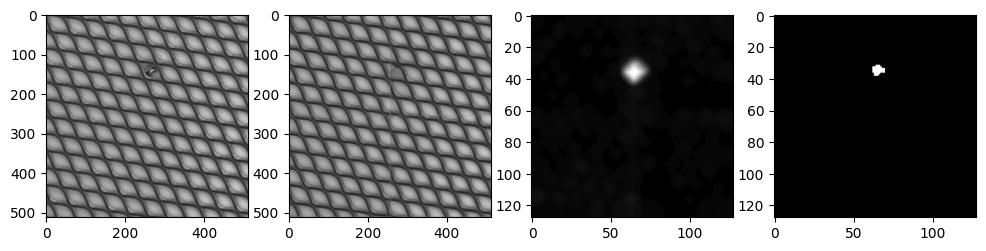

1


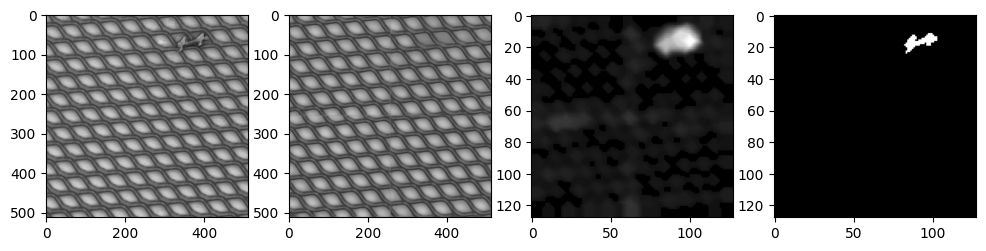

2


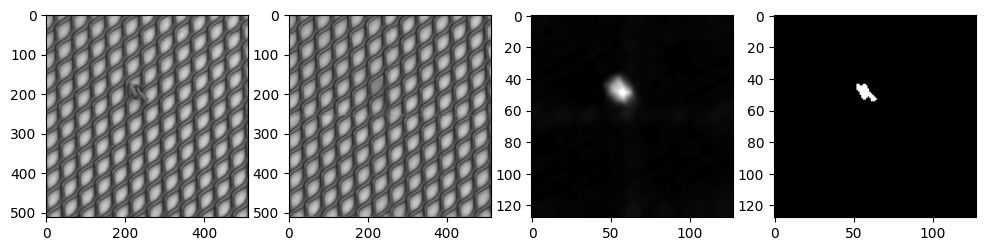

3


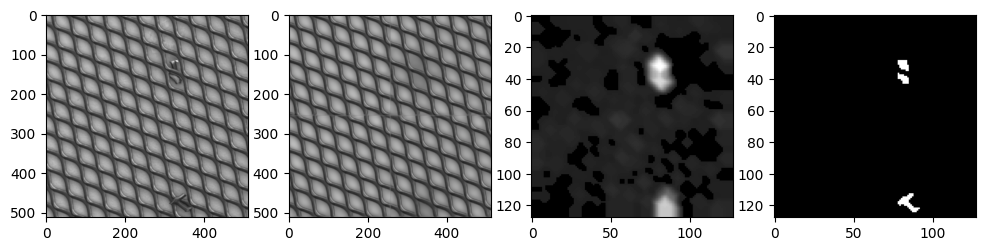

4


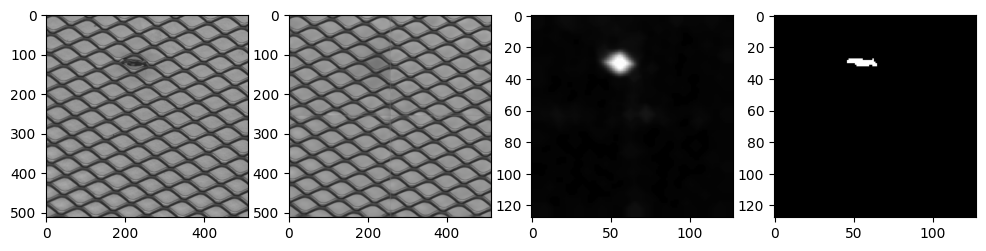

5


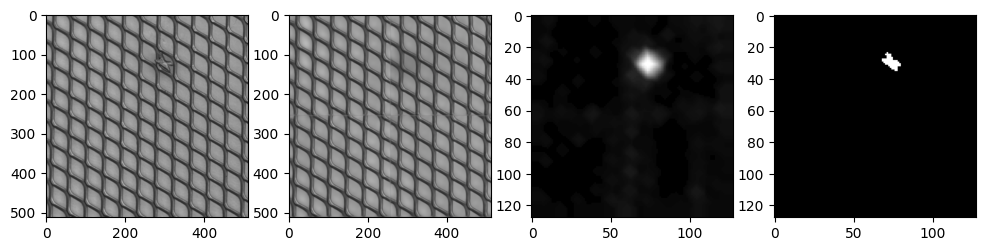

6


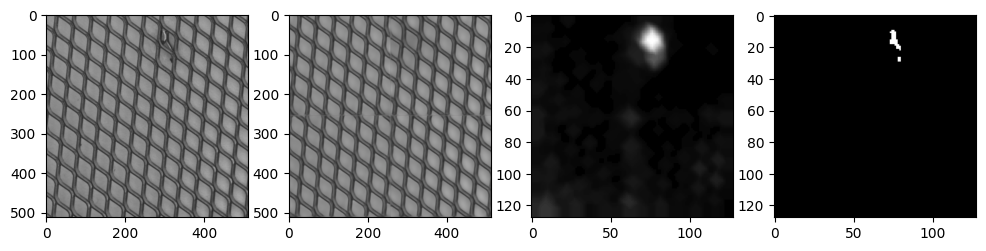

7


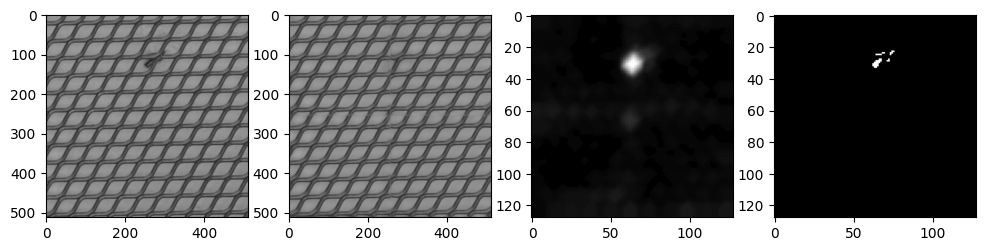

8


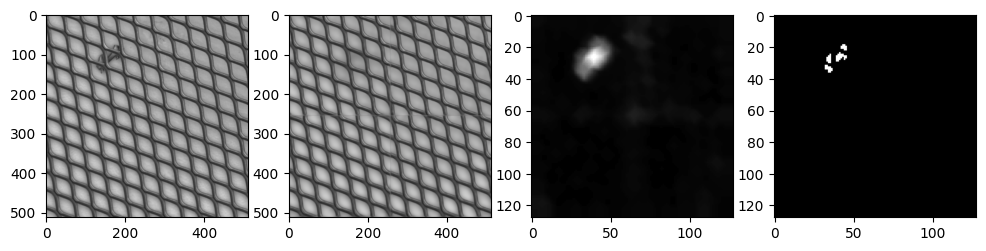

9


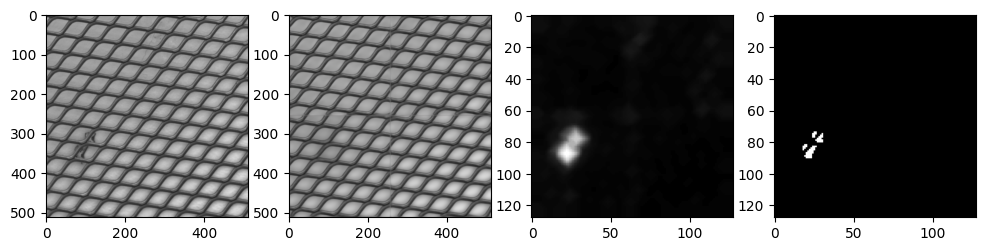

10


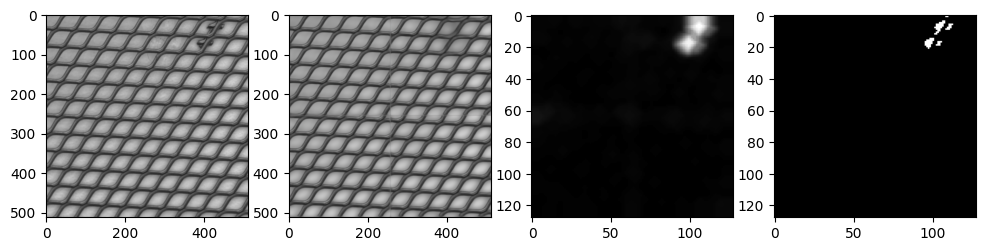

bent
0


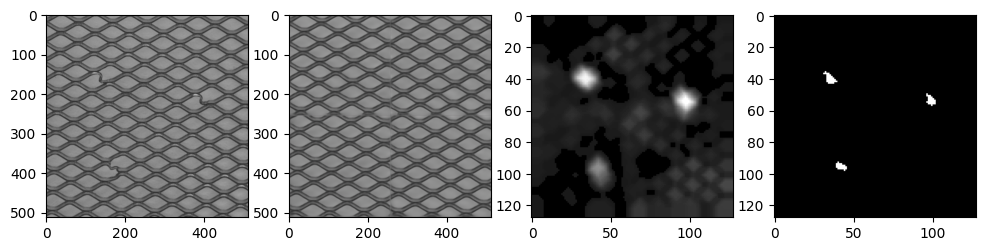

1


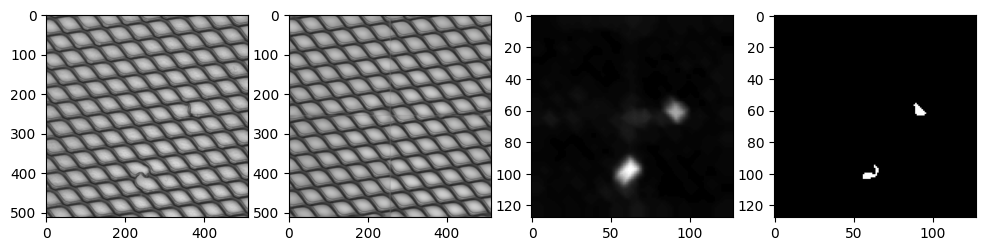

2


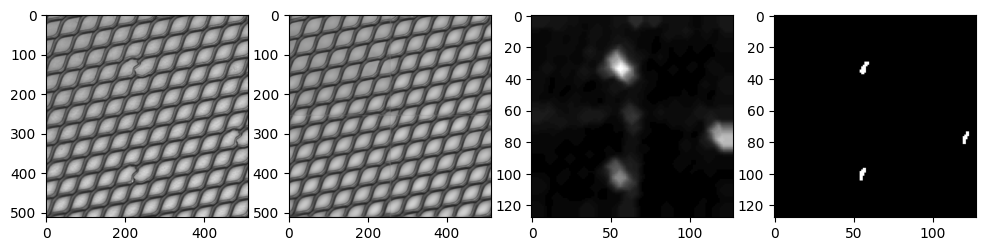

3


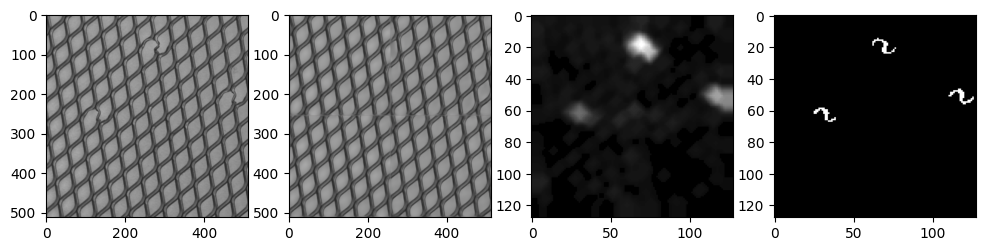

4


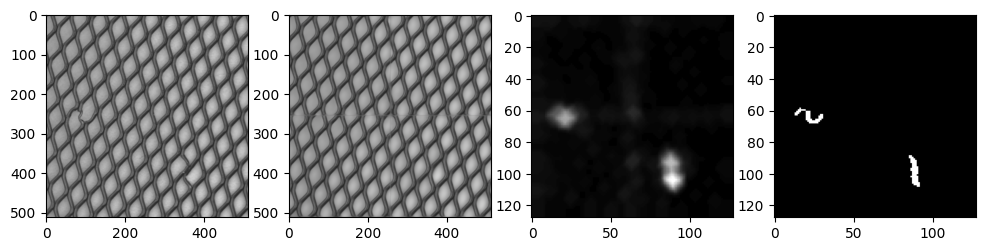

5


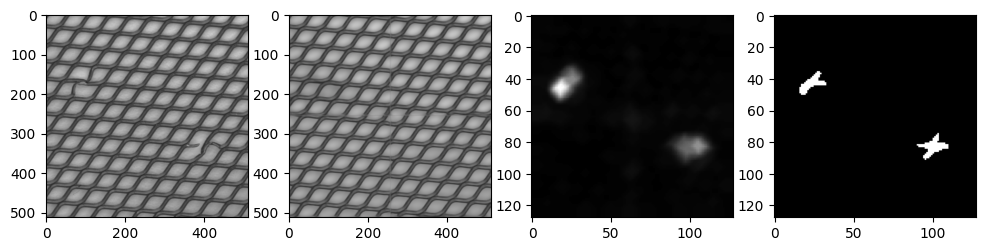

6


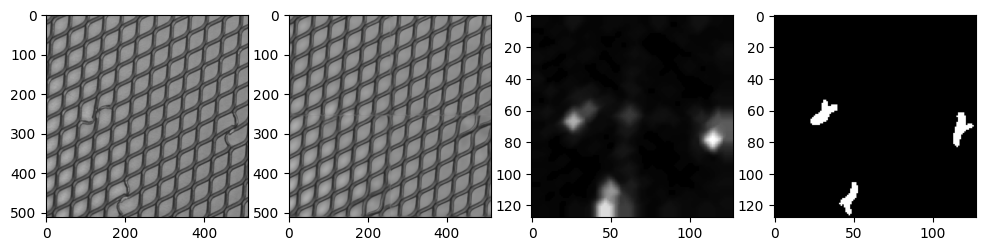

7


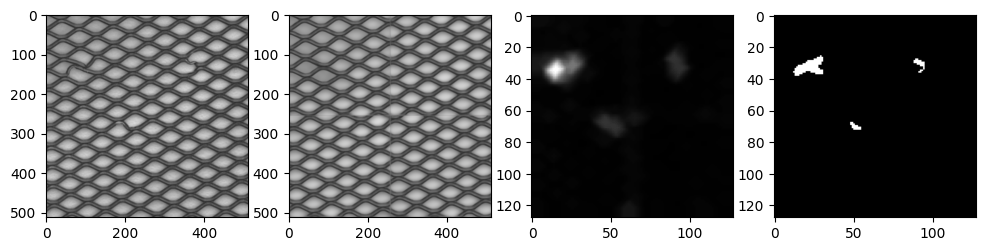

8


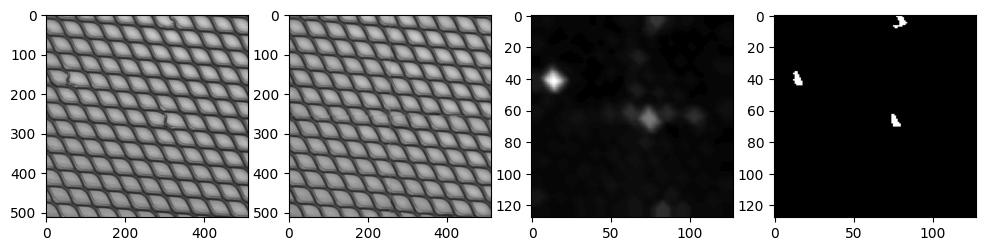

9


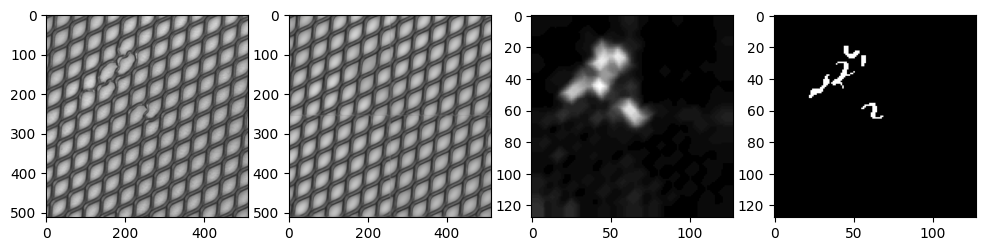

10


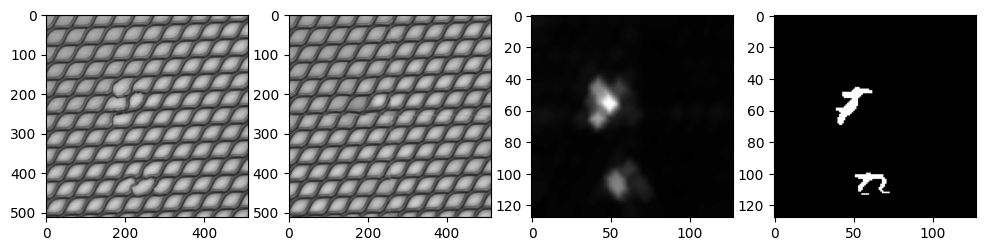

11


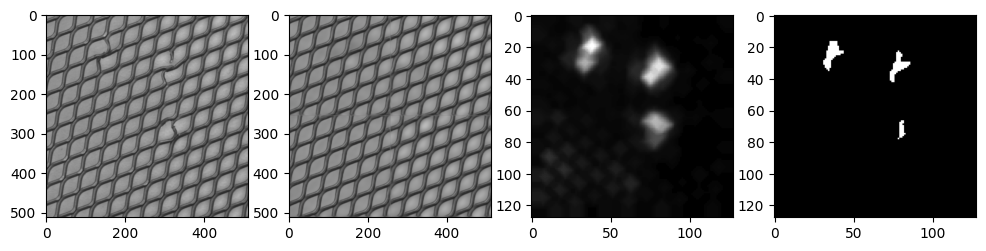

glue
0


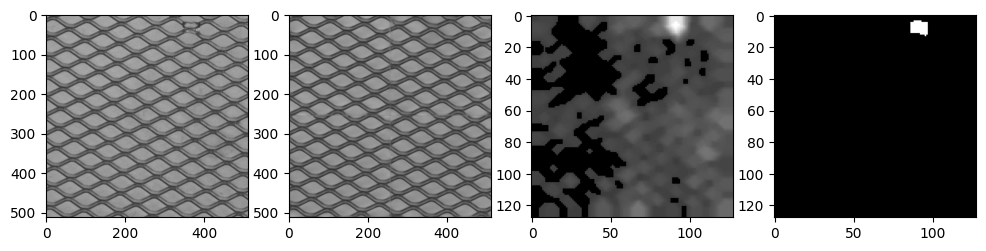

1


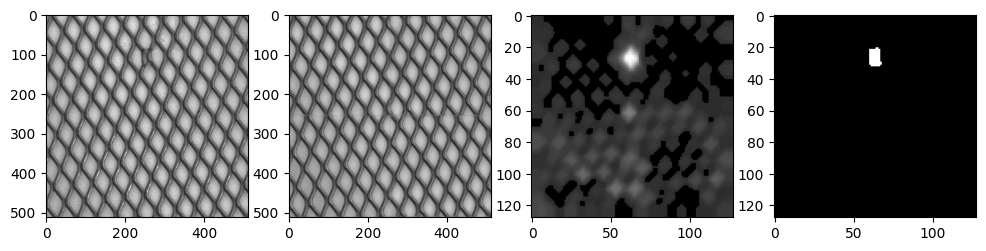

2


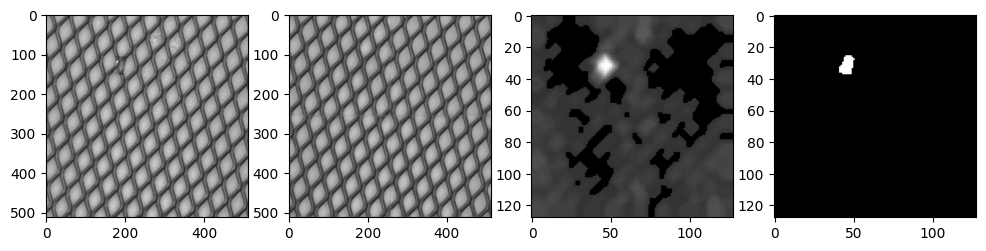

3


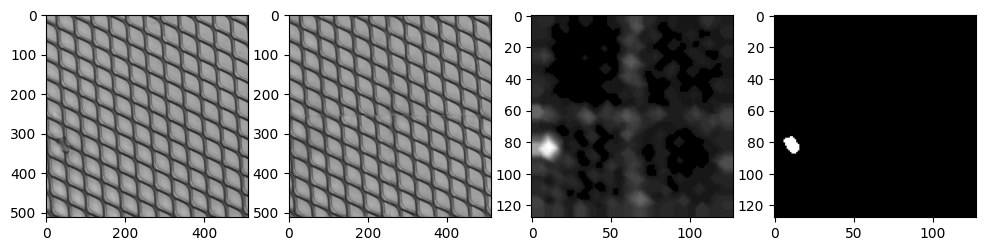

4


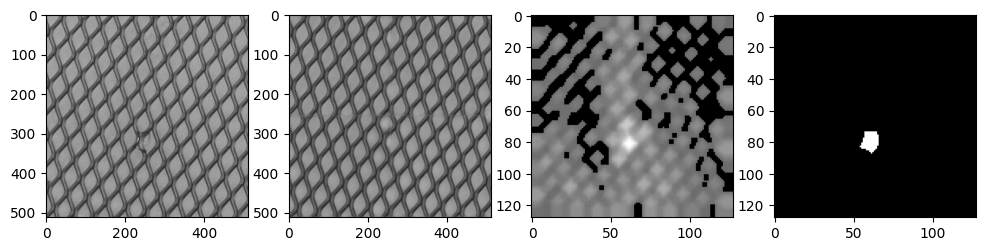

5


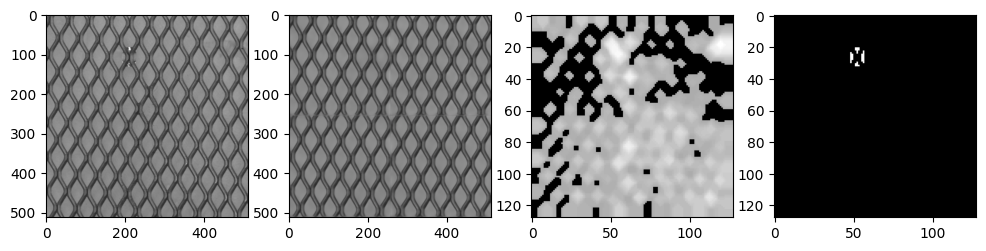

6


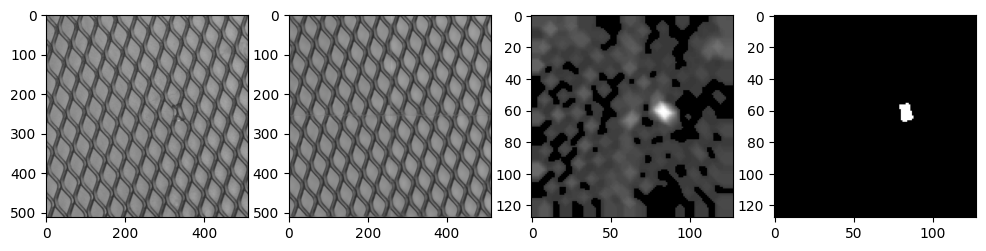

7


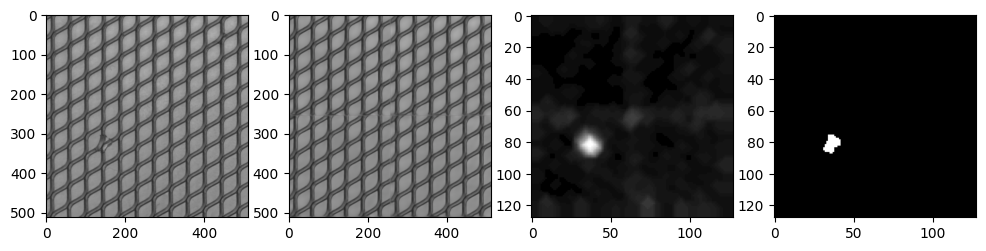

8


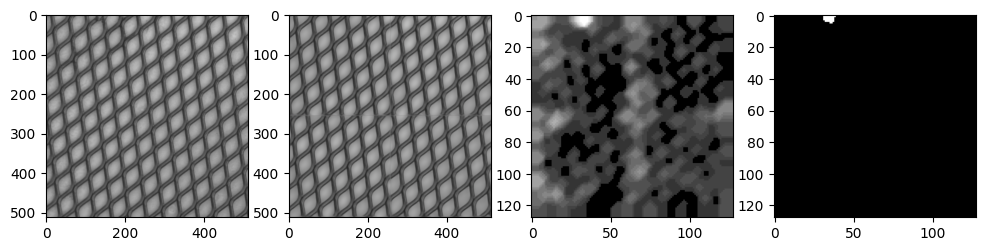

9


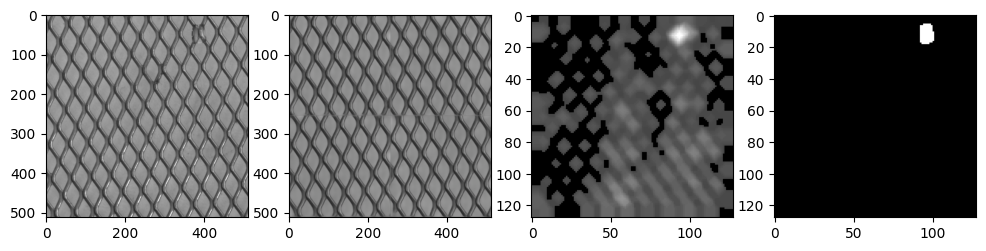

10


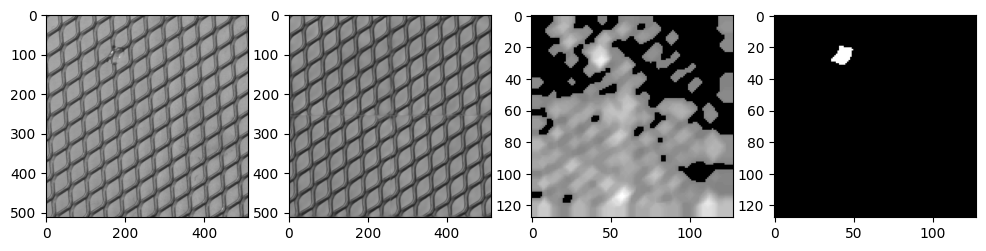

broken
0


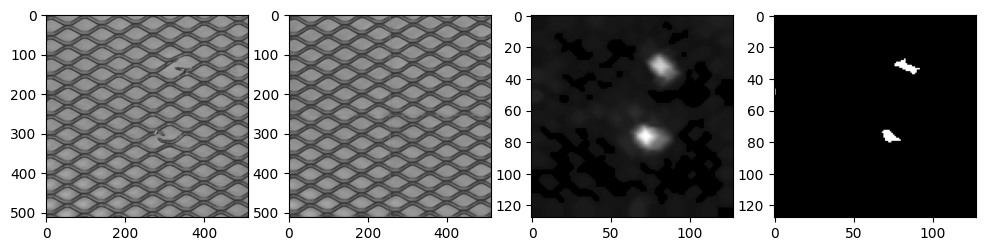

1


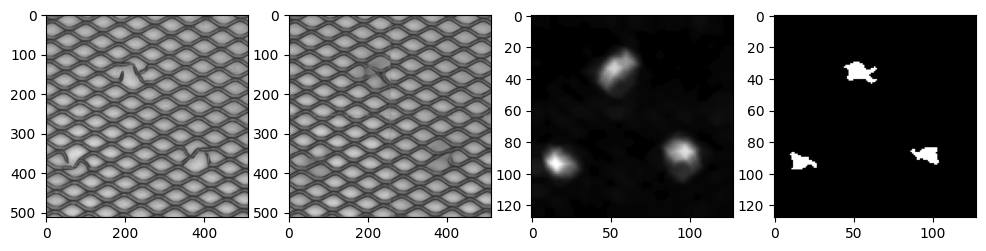

2


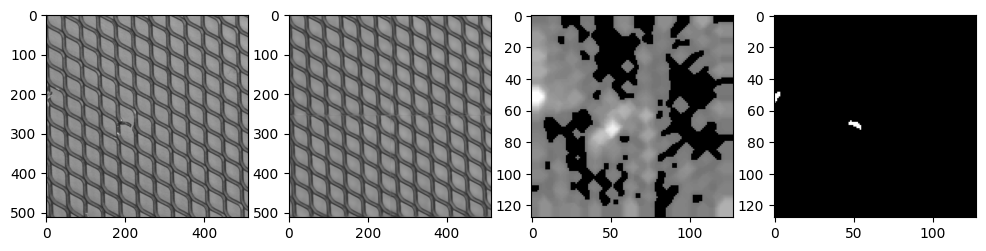

3


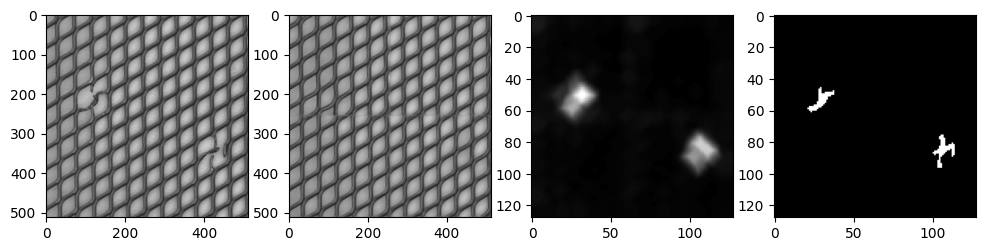

4


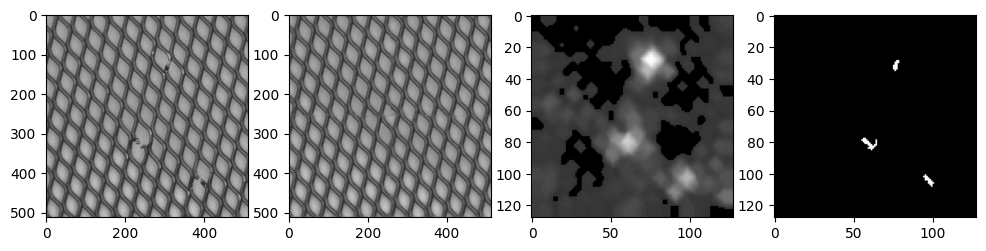

5


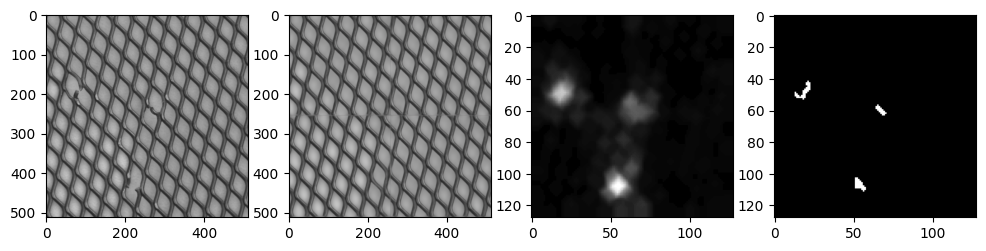

6


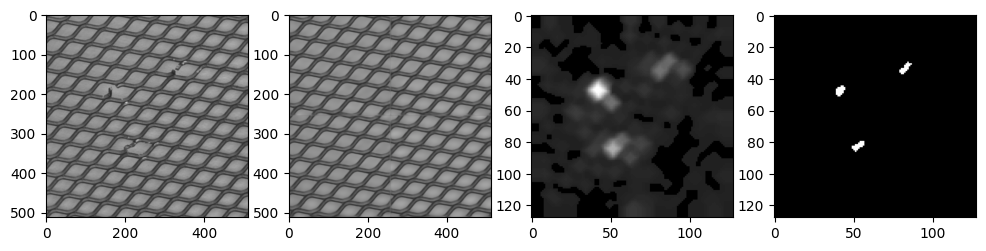

7


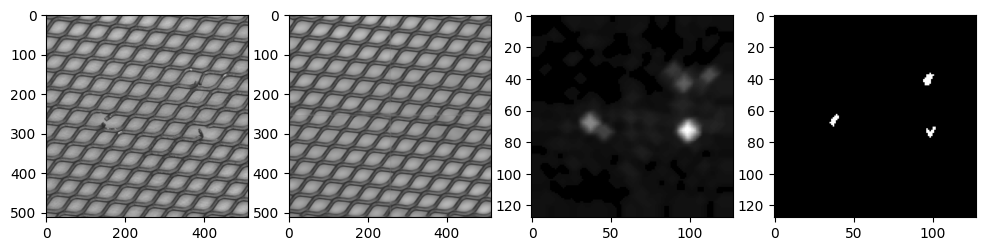

8


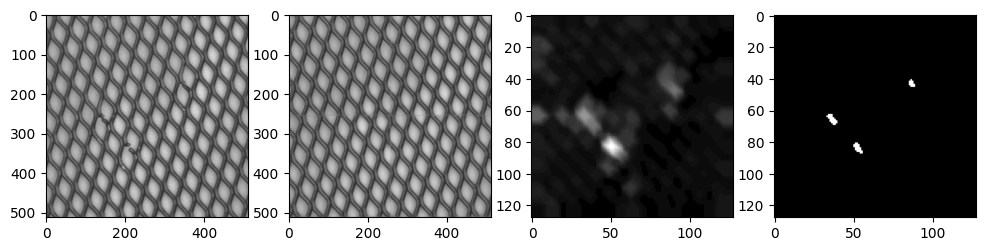

9


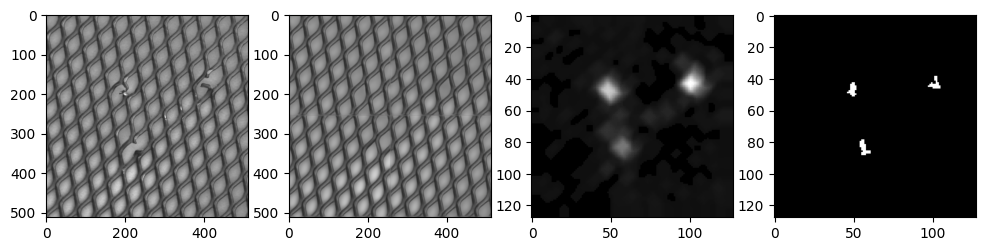

10


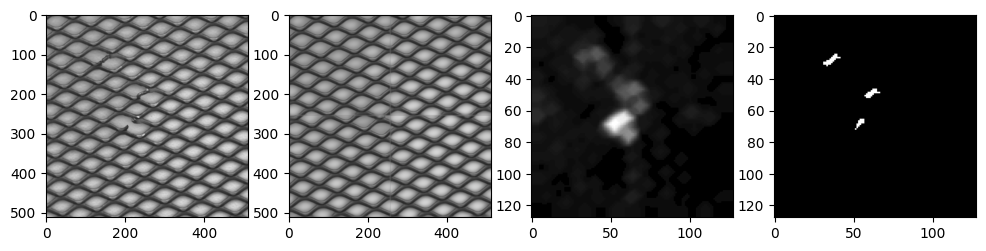

11


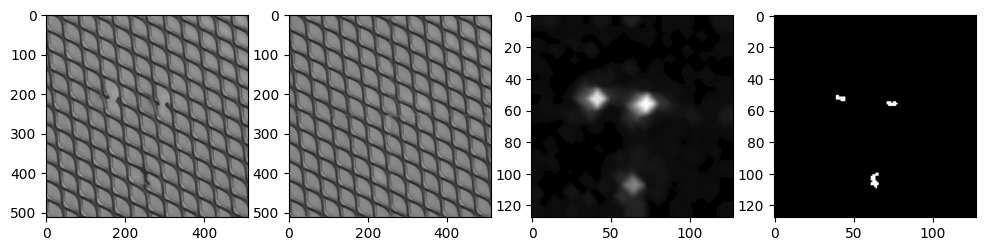

thread
0


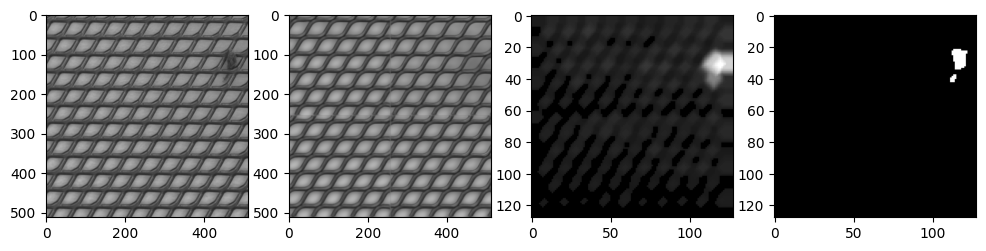

1


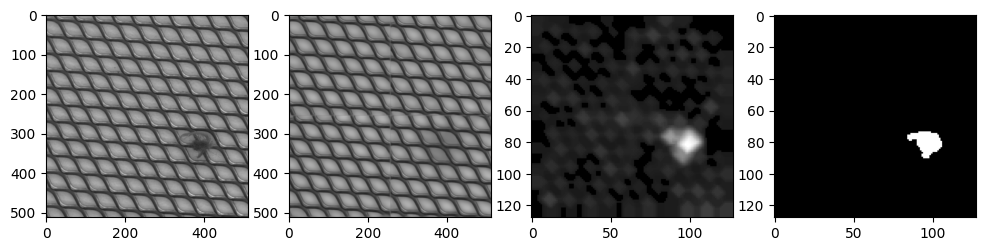

2


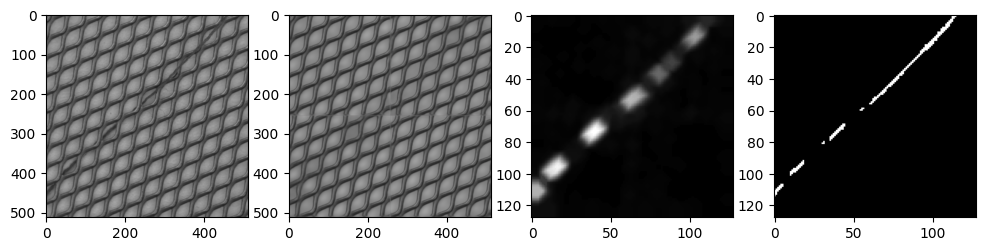

3


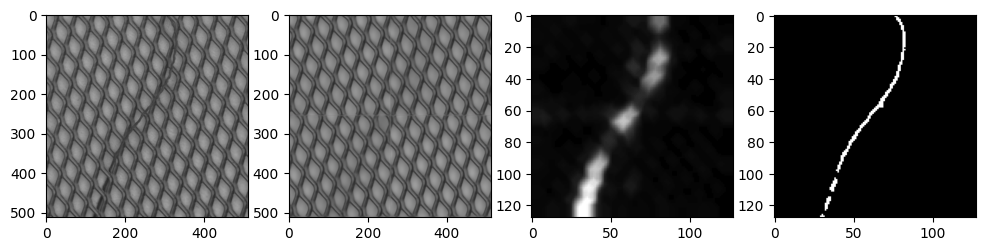

4


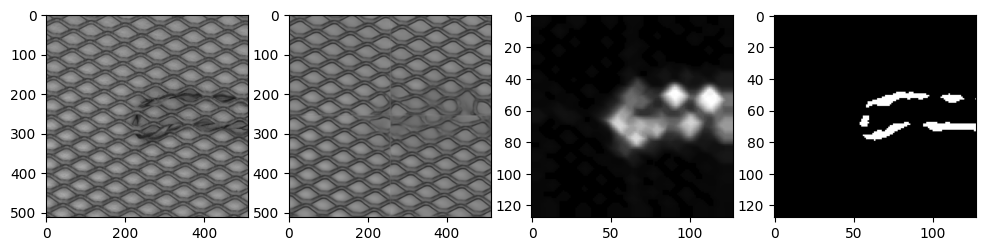

5


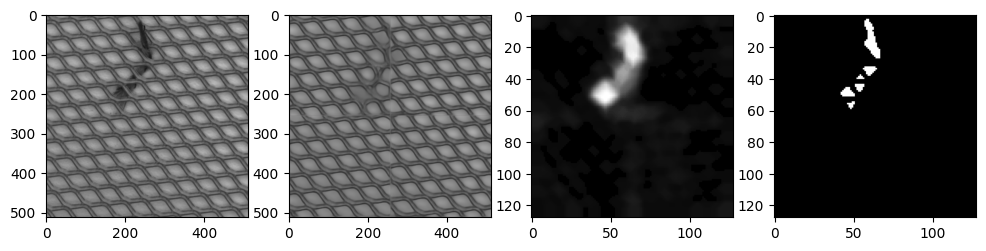

6


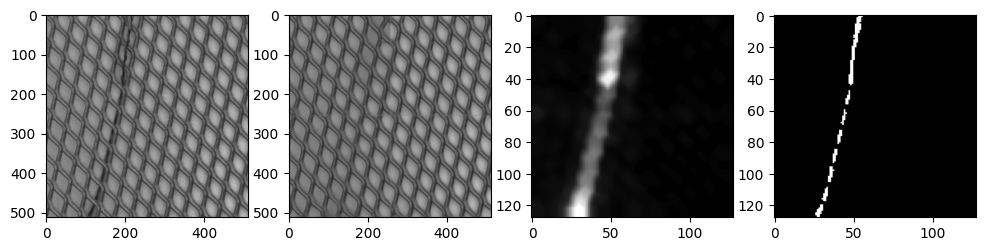

7


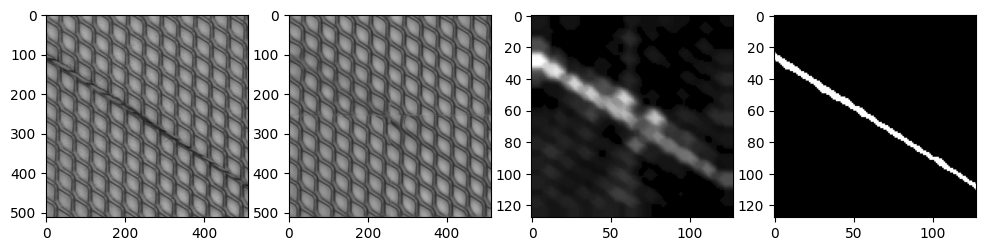

8


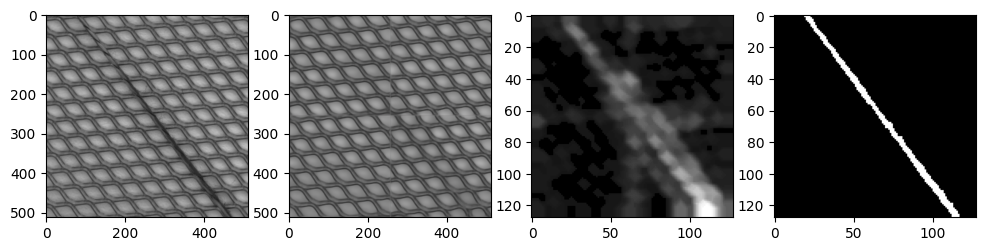

9


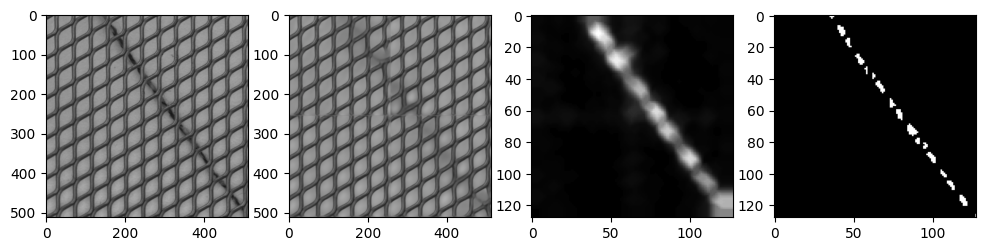

10


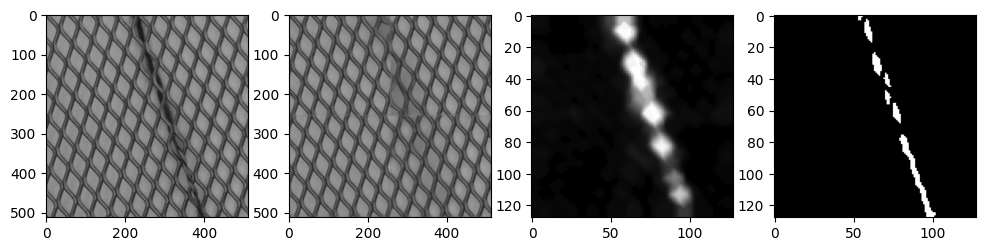

In [17]:
# 6. Apply test data 
    
test_class_list = os.listdir("./MVtecAD/%s/test"%(current_class))

ssim_map_list = []
true_map_list = []

for current_test in test_class_list:

    if current_test == "good":
        continue
    
    x_test = get_img("./MVtecAD/%s/test/%s/"%(current_class, current_test))
    x_true = get_true_img("./MVtecAD/%s/ground_truth/%s/"%(current_class, current_test))      

    print (current_test)
    
    # for each test image
    for idx in range(len(x_test)):

        print (idx)
        current_x_test = x_test[idx]
        
        # divide an image into 4 patches
        x_test_seg = divide_image(current_x_test)
        
        x_test_seg = x_test_seg.astype('float32') / 255.
        current_x_test = current_x_test.astype('float32') / 255.

        # conducts patch-level reconstruction
        x_test_recon = model.predict(x_test_seg)
       
        current_x_true = x_true[idx].astype('float32') / 255.        

        # stitch reconstructed patches
        stitched_recon = stitch_patch_image(current_x_test, x_test_recon)

        # generate ssim map
        ssim_map = calc_per_pixel_ssim(current_x_test, stitched_recon)
        ssim_map_proc = img_post_processing(ssim_map)
        
        # store results for calculating ROC AUC later
        ssim_map_list.append(ssim_map_proc)        
        true_map_list.append(current_x_true)
       
        # for visualization
        plt.figure(figsize=(12, 8), dpi=100)
        plt.axis('off')
        ax = plt.subplot(1, 4, 1)
        plt.imshow(current_x_test)            
        ax = plt.subplot(1, 4, 2)
        plt.imshow(stitched_recon)
        ax = plt.subplot(1, 4, 3)
        plt.imshow(ssim_map_proc, cmap='gray')       
        ax = plt.subplot(1, 4, 4)
        plt.imshow(current_x_true, cmap='gray')
        plt.show()

In [18]:
# 7. Calculate ROC AUC

calc_auc(ssim_map_list, true_map_list)

FPR  [0.7705420076551949, 0.7571447598540088, 0.6860238338709456, 0.6136848887027855, 0.5357089387008553, 0.4755943120959465, 0.43019742136532013, 0.39428566325622616, 0.3669275784576065, 0.34272461451614533, 0.31651573492406393, 0.2951022528633157, 0.27412758453041414, 0.2551363845944165, 0.24121502737111117, 0.22755636965474482, 0.21597490678920972, 0.2012215388540871, 0.18751969307695995, 0.1761057218146207, 0.1678131931198224, 0.15789501382299267, 0.1495741680669426, 0.14287938229177896, 0.13666790495648212, 0.13176152860540902, 0.12746262990801097, 0.12380103199331946, 0.11928597375665341, 0.11519599694873305, 0.1117646404422209, 0.10856201766263347, 0.10565745955911507, 0.1030275617362559, 0.10058206130209374, 0.09736983914965046, 0.09431209776428724, 0.0902010811492854, 0.08612468920394253, 0.08162910116554761, 0.07568856777232034, 0.06995826104158737, 0.06453457317810915, 0.06005247003569837, 0.05563206863162282, 0.05201404596106388, 0.04866998750397277, 0.04584601597477669, 0.